In [1]:
"""
Image Processing Laboratory (045108) - Meeting 2/4 - Image Denoising
Signal and Image Processing Lab (SIPL) & Vision and Image Sciences Lab (VISL)
The Andrew and Enra Viterbi Faculty of Electrical and Computer Engineering
Technion - Israel Institute of Technology
"""

import numpy as np
from scipy.ndimage import gaussian_filter1d
from skimage import color, feature, filters, io, metrics, transform, util
import matplotlib.pyplot as plt
from code import flir_image_extractor

# Thermal constants
THERMAL_MIN_VAL = 9620
THERMAL_MAX_VAL = 18070

# Useful tip: pressing Shift+Tab when the cursor is on a function name will display
# the documentation for that function.


# Helper Functions


In [24]:
def visual_prep(filename):
    """
    Prepares an image for the lab by reading, converting to grayscale (if necessary),
    normalizing, and resizing.

    Args:
        filename (str): Path to the image file.

    Returns:
        numpy.ndarray: The prepared image array.
    """

    image = io.imread(filename)
    if len(image.shape) == 3:
       image = color.rgb2gray(image)

    TARGET_WIDTH = 1600
    # Resize the image to TARGET_WIDTH columns keeping the original aspect ratio
    height, width = image.shape
    resize_factor = width / TARGET_WIDTH

    new_height = int(height/resize_factor)
    new_width = TARGET_WIDTH
    image = transform.resize(image, (new_height, new_width), anti_aliasing=True)
    image = util.img_as_ubyte(image)

    return image


def thermal_prep(filename):
    """
    Prepares a FLIR thermal image for the lab by reading it.

    Args:
        filename (str): Path to the FLIR thermal image file.

    Returns:
        numpy.ndarray: The prepared thermal image.
    """

    image_extractor = flir_image_extractor.FlirImageExtractor()
    image_extractor.process_image(filename)
    thermal = image_extractor.extract_thermal_image()

    return thermal


def thermal_prep_uint8(filename):
    """
    Prepares a FLIR thermal image for the lab by reading and converting it to uint8 format.

    Args:
        filename (str): Path to the FLIR thermal image file.

    Returns:
        numpy.ndarray: The prepared thermal image.
    """

    thermal = thermal_prep(filename)

    # Create a copy of the input image
    qth = np.copy(thermal)
    qth = qth.astype(np.float32)

    levels = 256
    # Divide the pixel value range into 'levels' number of buckets
    buckets = np.linspace(THERMAL_MIN_VAL, THERMAL_MAX_VAL, levels + 1)

    # Quantize the image
    count = 0
    for i in range(len(buckets) - 1):
        if i != (len(buckets) - 2):
            qth[(thermal >= buckets[i]) & (thermal < buckets[i + 1])] = count
            count = count + 1
        else:
            qth[(thermal >= buckets[i]) & (thermal <= buckets[i + 1])] = count

    qth = qth.astype(np.uint8)

    return qth


# Preparation - Assignment 3 - Denoising Using Linear Diffusion


In [ ]:
def linear_diffusion_1D(iterations_num, signal, sigma):
    """
    Performs 1D linear diffusion on a signal using Gaussian filtering.

    Args:
        iterations_num (int): Number of diffusion iterations.
        signal (np.ndarray): 1D array containing the signal values.
        sigma (float): Standard deviation of the Gaussian kernel.

    Returns:
        np.ndarray: The smoothed signal after linear diffusion.
    """

    K = 2   # sensitivity value

    for i in range(iterations_num):
        signal = gaussian_filter1d(signal, sigma/K**2)

    return signal


In [ ]:
# Questions 2 & 3

step_signal = np.zeros(512)
# TODO: Create a step signal with different heights

# TODO: Add white Gaussian noise
white_noise = np.random.normal(loc=???, scale=???, size=???)
noisy_signal = step_signal + white_noise

# Print the mean of the noisy signal
print(f"Average value of noisy signal: {np.mean(noisy_signal):.4f}")

# TODO: Run linear diffusion with different number of steps
# TODO: Print the mean of the denoised signals

plt.figure(figsize=(8, 5))
# TODO: Show results

plt.legend()
plt.xlabel("Data point")
plt.ylabel("Signal value")
plt.title("Linear Diffusion Runs")
plt.tight_layout()
plt.show()


In [ ]:
def linear_diffusion_2D(iterations_num, image, sigma):
    """
    Performs 2D linear diffusion on an image using Gaussian filtering.

    Args:
        iterations_num (int): Number of diffusion iterations.
        image (np.ndarray): 2D array containing the image values.
        sigma (float): Standard deviation of the Gaussian kernel.

    Returns:
        np.ndarray: The smoothed image after linear diffusion.
    """

    K = 3   # sensitivity value

    for i in range(iterations_num):
        image = filters.gaussian(image, sigma/K**2)

    return image


In [ ]:
# Question 4

# TODO: Load image as grayscale
image = ???

# TODO: Add white Gaussian noise
noisy_image = util.random_noise(???, mode='gaussian', var=???, clip=True)
noisy_image = util.img_as_ubyte(noisy_image)

# TODO: Run linear diffusion with different number of steps

# TODO: Perform Canny edge detection on the denoised images using the 'feature.canny' function

# Display the original image
plt.subplots(1, 2, figsize=(10, 5))
plt.subplot(1,2,1)
plt.imshow(image,  cmap='gray')
plt.axis('off')
plt.title('Original Image')

# Display the noisy image
plt.subplot(1,2,2)
plt.imshow(noisy_image, cmap='gray')
plt.axis('off')
plt.title('Noisy Image')
plt.show()

# TODO: Display the denoised images

# TODO: Display the edges of the denoised images


# Assignment 5 - Color Images


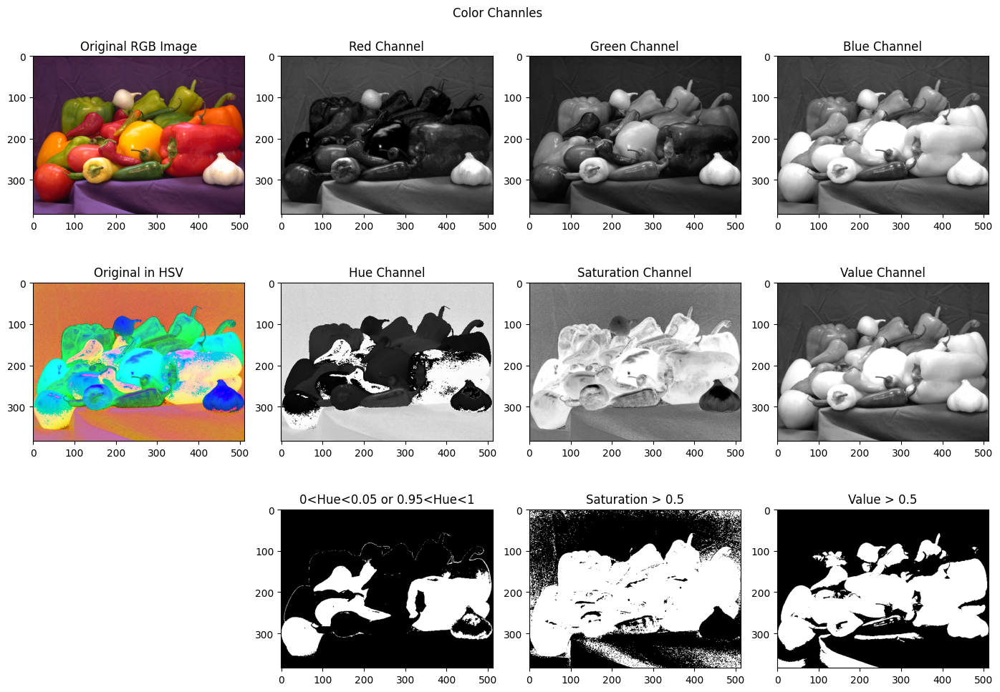

In [3]:
# Question 1

# Load the image
peppers_image = io.imread('images/peppers.png')

# Convert from RGB to HSV
peppers_hsv = color.rgb2hsv(peppers_image)

# Split color channels
peppers_r = peppers_image[:,:,2]
peppers_g = peppers_image[:,:,1]
peppers_b = peppers_image[:,:,0]
peppers_h = peppers_hsv[:,:,0]
peppers_s = peppers_hsv[:,:,1]
peppers_v = peppers_hsv[:,:,2]

# Show color channels
plt.figure(figsize=(14, 10))
plt.suptitle('Color Channles')

plt.subplot(3,4,1); plt.imshow(peppers_image); plt.title('Original RGB Image')
plt.subplot(3,4,2); plt.imshow(peppers_r, cmap='gray'); plt.title('Red Channel')
plt.subplot(3,4,3); plt.imshow(peppers_g, cmap='gray'); plt.title('Green Channel')
plt.subplot(3,4,4); plt.imshow(peppers_b, cmap='gray'); plt.title('Blue Channel')

plt.subplot(3,4,5); plt.imshow(peppers_hsv); plt.title('Original in HSV')
plt.subplot(3,4,6); plt.imshow(peppers_h, cmap='gray'); plt.title('Hue Channel')
plt.subplot(3,4,7); plt.imshow(peppers_s, cmap='gray'); plt.title('Saturation Channel')
plt.subplot(3,4,8); plt.imshow(peppers_v, cmap='gray'); plt.title('Value Channel')

plt.subplot(3,4,10); plt.imshow(np.logical_or(peppers_h > 0.95, peppers_h < 0.05), cmap='gray'); plt.title('0<Hue<0.05 or 0.95<Hue<1')
plt.subplot(3,4,11); plt.imshow(peppers_s > 0.5, cmap='gray'); plt.title('Saturation > 0.5')
plt.subplot(3,4,12); plt.imshow(peppers_v > 0.5, cmap='gray'); plt.title('Value > 0.5')

plt.tight_layout()
plt.show()


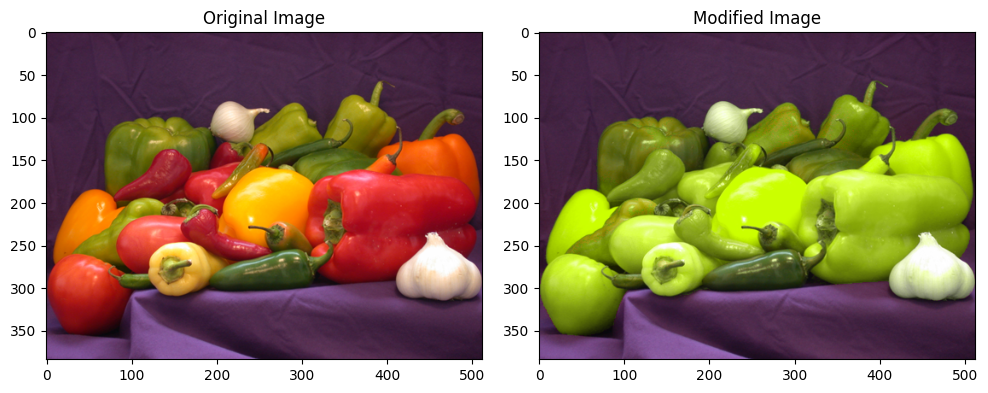

In [4]:
# Question 2

# Create a mask of peppers' hue values in a specific range
peppers_mask = np.logical_or(peppers_h >= 0.92, peppers_h <= 0.16)

#  Where the mask is True, set the hue values to a specific value, else don't change them
peppers_h_modified = np.where(peppers_mask, 0.2, peppers_h)

peppers_hsv_modified = peppers_hsv.copy()
peppers_hsv_modified[:, :, 0] = peppers_h_modified

# Convert back to RGB colorspace
peppers_modified_rgb = color.hsv2rgb(peppers_hsv_modified)

# Show original and modified image
plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
plt.imshow(peppers_image)
plt.title('Original Image')

plt.subplot(1,2,2)
plt.imshow(peppers_modified_rgb)
plt.title('Modified Image')

plt.tight_layout()
plt.show()


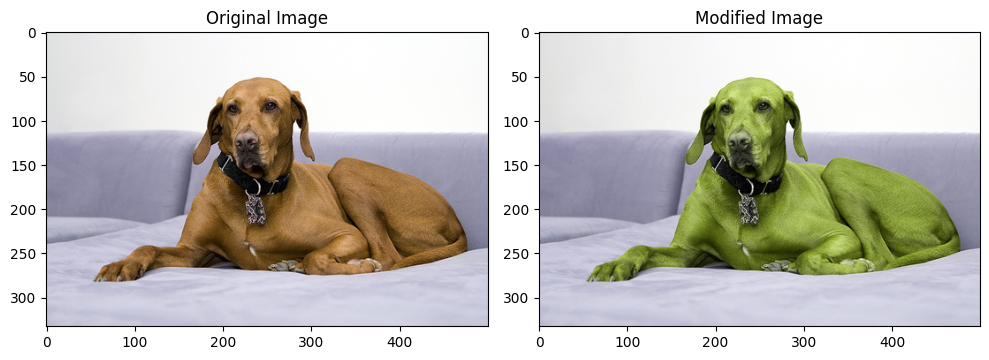

In [14]:
# Question 3

# TODO: Write code that uses the HSV colorspace to change the
#       dominant colors in the image you received from the instructor

# Load the image
dogo_image = io.imread('images/dog.jpg')

# Convert from RGB to HSV
dogo_hsv = color.rgb2hsv(dogo_image)

# Split color channels
dogo_h = dogo_hsv[:,:,0]
dogo_s = dogo_hsv[:,:,1]
dogo_v = dogo_hsv[:,:,2]

# Create a mask of dogo' hue values in a specific range
dogo_mask = np.logical_or(dogo_h >= 0.8, dogo_h <= 0.55)

#  Where the mask is True, set the hue values to a specific value, else don't change them
dogo_h_modified = np.where(dogo_mask, 0.2, dogo_h)

dogo_hsv_modified = dogo_hsv.copy()
dogo_hsv_modified[:, :, 0] = dogo_h_modified

# Convert back to RGB colorspace
dogo_modified_rgb = color.hsv2rgb(dogo_hsv_modified)

# Show original and modified image
plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
plt.imshow(dogo_image)
plt.title('Original Image')

plt.subplot(1,2,2)
plt.imshow(dogo_modified_rgb)
plt.title('Modified Image')

plt.tight_layout()
plt.show()





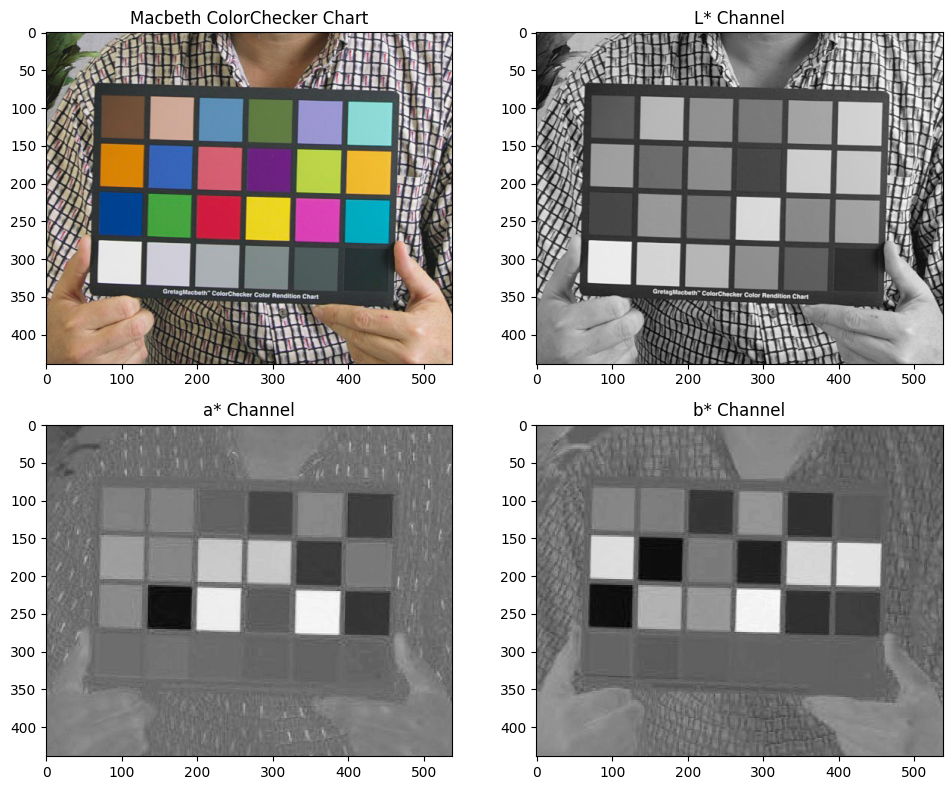

In [15]:
# Question 4

# Load the ColorChecker image
colorchecker = io.imread('images/colorchecker.jpg')

# Convert to LAB colorspace and split channels
colorchecker_lab = color.rgb2lab(colorchecker)
colorchecker_L = colorchecker_lab[:, :, 0]
colorchecker_a = colorchecker_lab[:, :, 1]
colorchecker_b = colorchecker_lab[:, :, 2]

# Show the original image and its LAB channels
plt.figure(figsize=(10, 8))

plt.subplot(2,2,1)
plt.imshow(colorchecker)
plt.title('Macbeth ColorChecker Chart')

plt.subplot(2,2,2)
plt.imshow(colorchecker_L, cmap='gray')
plt.title('L* Channel')

plt.subplot(2,2,3)
plt.imshow(colorchecker_a, cmap='gray')
plt.title('a* Channel')

plt.subplot(2,2,4)
plt.imshow(colorchecker_b, cmap='gray')
plt.title('b* Channel')

plt.tight_layout()
plt.show()


C:/Users/danelv/AppData/Local/Temp/xpython_9008/287850691.py:21: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 7278 negative Z values that have been clipped to zero
  mix_L= color.lab2rgb(mix_L)
C:/Users/danelv/AppData/Local/Temp/xpython_9008/287850691.py:33: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 17 negative Z values that have been clipped to zero
  mix_b= color.lab2rgb(mix_b)


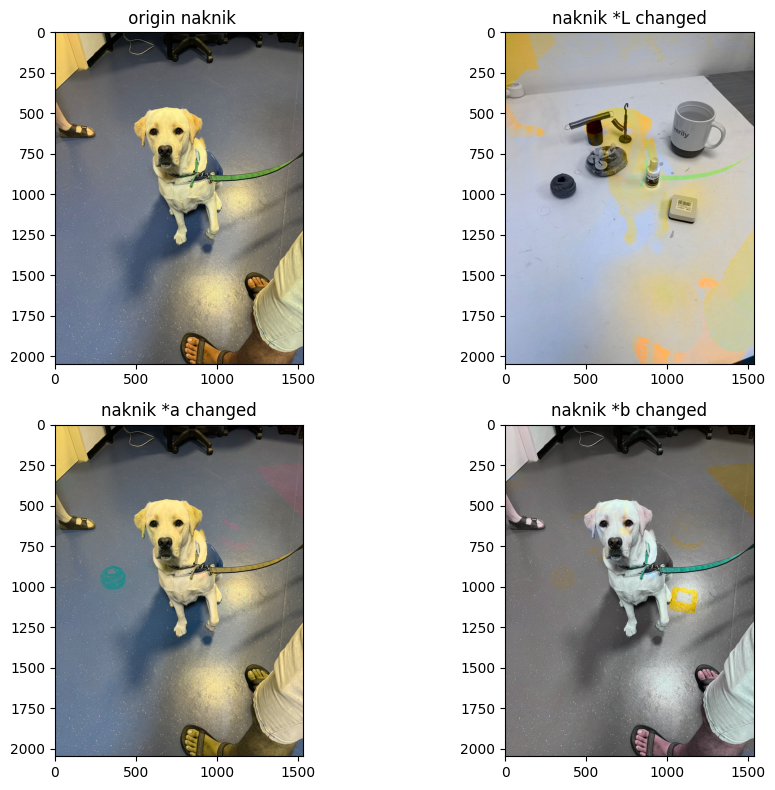

In [21]:
# Question 5

# TODO: Select two of the visual images you took and convert them to the
#       LAB colorspace
naknik = io.imread('images/naknik.jpeg')
front = io.imread('images/front.jpeg')




front_lab = color.rgb2lab(front)
front_L = front_lab[:, :, 0]
front_a = front_lab[:, :, 1]
front_b = front_lab[:, :, 2]

# TODO: Replace the L channel of the first image with the L channel of the
#       second image and show the result

mix_L= color.rgb2lab(naknik)
mix_L[:,:,0]= front_L
mix_L= color.lab2rgb(mix_L)

# TODO: Replace the a channel of the first image with the a channel of the
#       second image and show the result
mix_a= color.rgb2lab(naknik)
mix_a[:,:,1]= front_a
mix_a= color.lab2rgb(mix_a)

# TODO: Replace the b channel of the first image with the b channel of the
#       second image and show the result
mix_b= color.rgb2lab(naknik)
mix_b[:,:,2]= front_b
mix_b= color.lab2rgb(mix_b)




# Show the original image and its LAB channels
plt.figure(figsize=(10, 8))

plt.subplot(2,2,1)
plt.imshow(naknik)
plt.title(' origin naknik')

plt.subplot(2,2,2)
plt.imshow(mix_L, cmap='gray')
plt.title('naknik *L changed')

plt.subplot(2,2,3)
plt.imshow(mix_a, cmap='gray')
plt.title('naknik *a changed')

plt.subplot(2,2,4)
plt.imshow(mix_b, cmap='gray')
plt.title('naknik *b changed')

plt.tight_layout()
plt.show()

# Assignment 2 - Denoising Using Spatial Filtering


In [22]:
# Questions 1-3

# Run image denoising app
!python code/im_denoising_app.py


C:\ProgramData\anaconda3\envs\ip_lab\Lib\tkinter\__init__.py:1948: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  return self.func(*args)


In [42]:
import os
os.getcwd()

'C:\\Users\\danelv\\Documents\\meeting2_D_O'

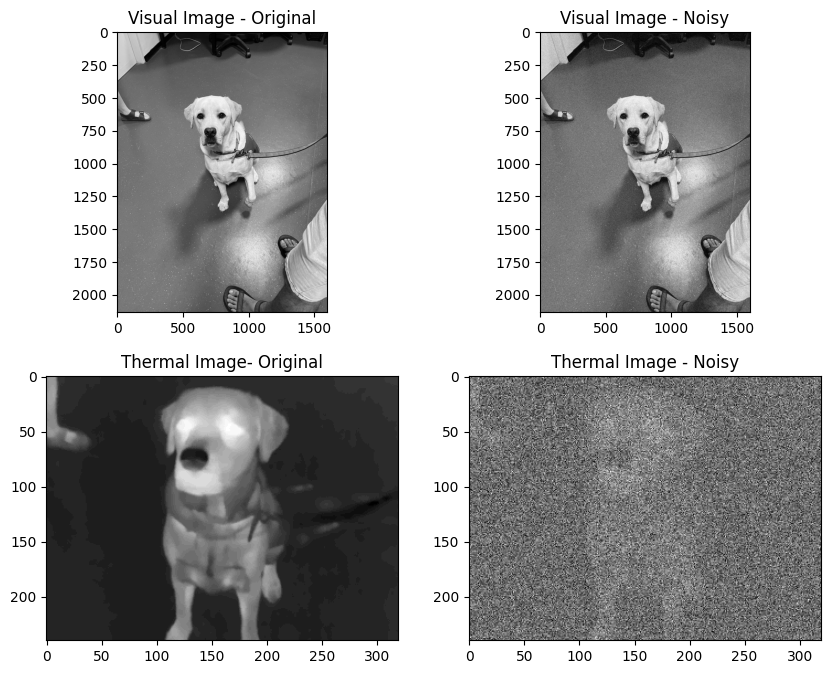

PSNR for visual noisy image: 20.13
PSNR for thermal noisy image: 19.99
SSIM for visual noisy image: 0.23
SSIM for thermal noisy image: 0.09


In [31]:
# Question 4

# TODO: Read visual image and prepare it for the lab
visual_image = visual_prep('images/naknik.jpeg')

# TODO: Read thermal image and prepare it for the lab
thermal_image_uint8 = thermal_prep_uint8('images/nakniktherm.jpg')

# TODO: Add White Gaussian Noise to the visual image
#       Use variance values of 0.01, 0.05, 0.1
noisy_visual = util.random_noise(visual_image, mode='gaussian', mean=0, var=0.01)
noisy_visual = 255*noisy_visual
noisy_visual = noisy_visual.astype(np.uint8)

# TODO: Add White Gaussian Noise to the thermal image
#       Use variance values of 0.01, 0.05, 0.1
noisy_thermal = util.random_noise(thermal_image_uint8, mode='gaussian', mean=0, var=0.01)
noisy_thermal = util.img_as_ubyte(noisy_thermal)

# Show the two original and the two noisy images
plt.figure(figsize=(10, 8))
plt.subplot(2, 2, 1)
plt.imshow(visual_image, cmap='gray')
plt.title('Visual Image - Original')
plt.subplot(2, 2, 2)
plt.imshow(noisy_visual, cmap='gray')
plt.title('Visual Image - Noisy')
plt.subplot(2, 2, 3)
plt.imshow(thermal_image_uint8, cmap='gray')
plt.title('Thermal Image- Original')
plt.subplot(2, 2, 4)
plt.imshow(noisy_thermal, cmap='gray')
plt.title('Thermal Image - Noisy')
plt.show()

# TODO: Calculate PSNR between original and noisy images
psnr_visual = metrics.peak_signal_noise_ratio(visual_image, noisy_visual)
psnr_thermal = metrics.peak_signal_noise_ratio(thermal_image_uint8, noisy_thermal)

print(f'PSNR for visual noisy image: {psnr_visual:.2f}')
print(f'PSNR for thermal noisy image: {psnr_thermal:.2f}')

# TODO: Calculate SSIM between original and noisy images
ssim_visual = metrics.structural_similarity(visual_image, noisy_visual)
ssim_thermal = metrics.structural_similarity(thermal_image_uint8, noisy_thermal)

print(f'SSIM for visual noisy image: {ssim_visual:.2f}')
print(f'SSIM for thermal noisy image: {ssim_thermal:.2f}')


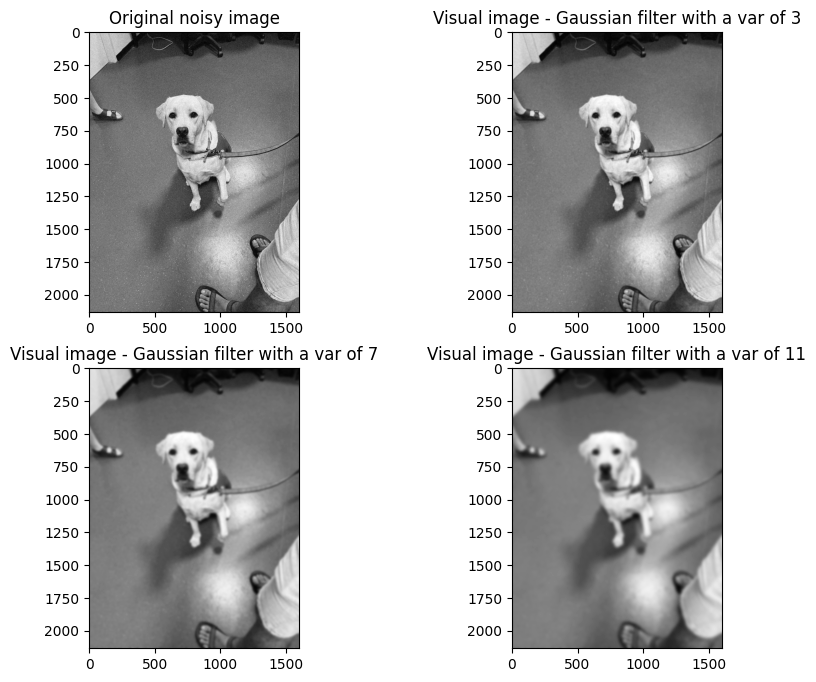

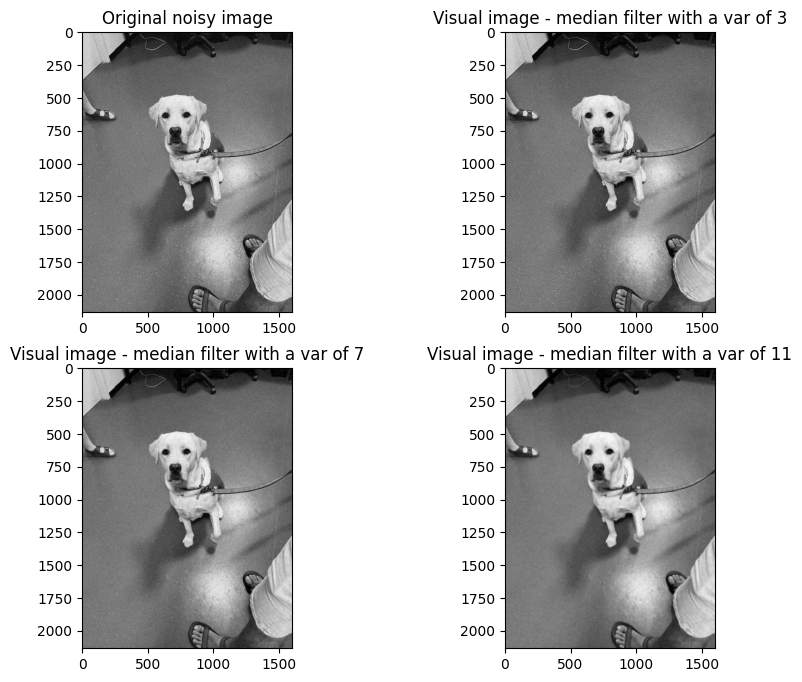

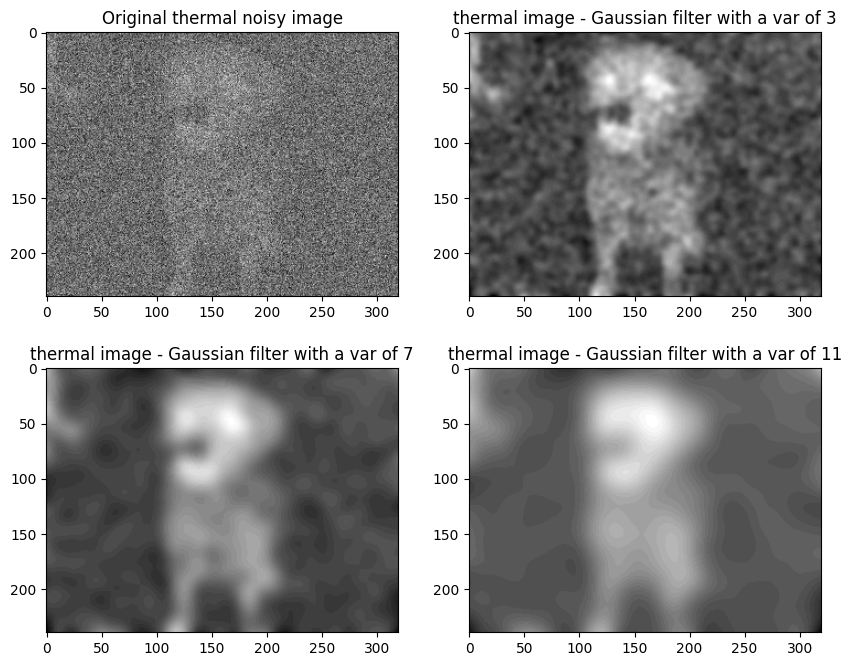

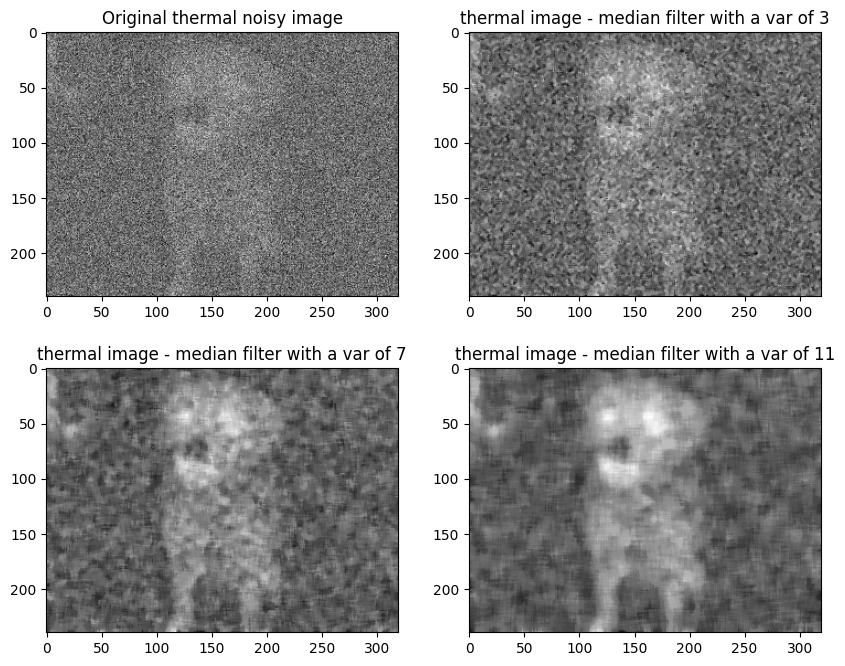

PSNR for visual Gaussian filtered image: 27.58
PSNR for thermal Gaussian filtered image: 39.52
PSNR for visual Median filtered image: 26.88
PSNR for thermal Median filtered image: 27.74
SSIM for visual Gaussian filtered image: 0.67
SSIM for thermal Gaussian filtered image: 0.96
SSIM for visual Median filtered image: 0.51
SSIM for thermal Median filtered image: 0.41


In [41]:
# Question 5

# TODO: Filter the noisy visual image and noisy thermal image with Gaussian filter
#       Use the 'filters.gaussian' function with sigma values of 3, 7, 11
#       Don't forget to convert back to uint8 using the 'util.img_as_ubyte' function
gaussian_filtered_3 =  filters.gaussian(noisy_visual,sigma =3)
gaussian_filtered_7 = filters.gaussian(noisy_visual,sigma =7)
gaussian_filtered_11 = filters.gaussian(noisy_visual,sigma =11)

gaussian_filtered_3= util.img_as_ubyte(gaussian_filtered_3)
gaussian_filtered_7= util.img_as_ubyte(gaussian_filtered_7)
gaussian_filtered_11= util.img_as_ubyte(gaussian_filtered_11)

gaussian_thermal_filtered_3 =  filters.gaussian(noisy_thermal,sigma =3)
gaussian_thermal_filtered_7 = filters.gaussian(noisy_thermal,sigma =7)
gaussian_thermal_filtered_11 = filters.gaussian(noisy_thermal,sigma =11)


gaussian_thermal_filtered_3= util.img_as_ubyte(gaussian_thermal_filtered_3)
gaussian_thermal_filtered_7= util.img_as_ubyte(gaussian_thermal_filtered_7)
gaussian_thermal_filtered_11= util.img_as_ubyte(gaussian_thermal_filtered_11)


# TODO: Filter the noisy visual image and noisy thermal image with median filter
#       Use the 'filters.median' function with kernal size values of 3, 7, 11
#       To select the kernel size, use the 'foorprint' parameter with 'np.ones'
#       Don't forget to convert back to uint8 using the 'util.img_as_ubyte' function

median_filtered_3 =  filters.median(noisy_visual, footprint = np.ones((3,3)))
median_filtered_7 = filters.median(noisy_visual, footprint = np.ones((7,7)))
median_filtered_11 = filters.median(noisy_visual, footprint = np.ones((11,11)))

median_filtered_3= util.img_as_ubyte(median_filtered_3)
median_filtered_7= util.img_as_ubyte(median_filtered_7)
median_filtered_11= util.img_as_ubyte(median_filtered_11)

median_thermal_filtered_3 =  filters.median(noisy_thermal, footprint = np.ones((3,3)))
median_thermal_filtered_7 = filters.median(noisy_thermal, footprint = np.ones((7,7)))
median_thermal_filtered_11 = filters.median(noisy_thermal, footprint = np.ones((11,11)))

median_thermal_filtered_3= util.img_as_ubyte(median_thermal_filtered_3)
median_thermal_filtered_7= util.img_as_ubyte(median_thermal_filtered_7)
median_thermal_filtered_11= util.img_as_ubyte(median_thermal_filtered_11)

# TODO: Show the two noisy images after Gaussian and after median filtering

plt.figure(figsize=(10, 8))
plt.subplot(2, 2, 1)
plt.imshow(noisy_visual, cmap='gray')
plt.title('Original noisy image')
plt.subplot(2, 2, 2)
plt.imshow(gaussian_filtered_3, cmap='gray')
plt.title('Visual image - Gaussian filter with a var of 3')
plt.subplot(2, 2, 3)
plt.imshow(gaussian_filtered_7, cmap='gray')
plt.title('Visual image - Gaussian filter with a var of 7')
plt.subplot(2, 2, 4)
plt.imshow(gaussian_filtered_11, cmap='gray')
plt.title('Visual image - Gaussian filter with a var of 11')
plt.show()

plt.figure(figsize=(10, 8))
plt.subplot(2, 2, 1)
plt.imshow(noisy_visual, cmap='gray')
plt.title('Original noisy image')
plt.subplot(2, 2, 2)
plt.imshow(median_filtered_3, cmap='gray')
plt.title('Visual image - median filter with a var of 3')
plt.subplot(2, 2, 3)
plt.imshow(median_filtered_7, cmap='gray')
plt.title('Visual image - median filter with a var of 7')
plt.subplot(2, 2, 4)
plt.imshow(median_filtered_11, cmap='gray')
plt.title('Visual image - median filter with a var of 11')
plt.show()

plt.figure(figsize=(10, 8))
plt.subplot(2, 2, 1)
plt.imshow(noisy_thermal, cmap='gray')
plt.title('Original thermal noisy image')
plt.subplot(2, 2, 2)
plt.imshow(gaussian_thermal_filtered_3, cmap='gray')
plt.title('thermal image - Gaussian filter with a var of 3')
plt.subplot(2, 2, 3)
plt.imshow(gaussian_thermal_filtered_7, cmap='gray')
plt.title('thermal image - Gaussian filter with a var of 7')
plt.subplot(2, 2, 4)
plt.imshow(gaussian_thermal_filtered_11, cmap='gray')
plt.title('thermal image - Gaussian filter with a var of 11')
plt.show()

plt.figure(figsize=(10, 8))
plt.subplot(2, 2, 1)
plt.imshow(noisy_thermal, cmap='gray')
plt.title('Original thermal noisy image')
plt.subplot(2, 2, 2)
plt.imshow(median_thermal_filtered_3, cmap='gray')
plt.title('thermal image - median filter with a var of 3')
plt.subplot(2, 2, 3)
plt.imshow(median_thermal_filtered_7, cmap='gray')
plt.title('thermal image - median filter with a var of 7')
plt.subplot(2, 2, 4)
plt.imshow(median_thermal_filtered_11, cmap='gray')
plt.title('thermal image - median filter with a var of 11')
plt.show()


# TODO: Calculate PSNR between original and filtered images
#       Using 'skimage.metrics'
psnr_visual_gaussian = metrics.peak_signal_noise_ratio(visual_image, gaussian_filtered_3)
psnr_thermal_gaussian = metrics.peak_signal_noise_ratio(thermal_image_uint8, gaussian_thermal_filtered_3)
psnr_visual_median = metrics.peak_signal_noise_ratio(visual_image, median_filtered_3)
psnr_thermal_median = metrics.peak_signal_noise_ratio(thermal_image_uint8, median_thermal_filtered_3)

print(f'PSNR for visual Gaussian filtered image: {psnr_visual_gaussian:.2f}')
print(f'PSNR for thermal Gaussian filtered image: {psnr_thermal_gaussian:.2f}')
print(f'PSNR for visual Median filtered image: {psnr_visual_median:.2f}')
print(f'PSNR for thermal Median filtered image: {psnr_thermal_median:.2f}')

# TODO: Calculate PSNR & SSIM values between original and Median filtered images
#       Using 'skimage.metrics'
ssim_visual_gaussian = metrics.structural_similarity(visual_image, gaussian_filtered_3)
ssim_thermal_gaussian = metrics.structural_similarity(thermal_image_uint8, gaussian_thermal_filtered_3)
ssim_visual_median = metrics.structural_similarity(visual_image, median_filtered_3)
ssim_thermal_median = metrics.structural_similarity(thermal_image_uint8, median_thermal_filtered_3)

print(f'SSIM for visual Gaussian filtered image: {ssim_visual_gaussian:.2f}')
print(f'SSIM for thermal Gaussian filtered image: {ssim_thermal_gaussian:.2f}')
print(f'SSIM for visual Median filtered image: {ssim_visual_median:.2f}')
print(f'SSIM for thermal Median filtered image: {ssim_thermal_median:.2f}')


# Assignment 3 - Denoising Using Non-linear Diffusion


In [44]:
def anisotropic_diffusion(noisy_image, original_image, iterations_num, delta_t=0.2, kappa=20.0, stop_condition='fixed'):
    """
    Apply non-linear anisotropic diffusion process to the input image.

    Args:
      noisy_image (np.ndarray): The noisy image to be denoised.
      original_image (np.ndarray): The original image for calculating PSNR.
      iterations_num (int): The maximal number of iterations to perform for denoising.
      delta_t (float): Size of the time step for each iteration (default: 0.2).
      kappa (float): Sesitivity constant (default: 20.0).
      stop_condition (str): The condition for stopping the process (deafult: 'fixed'). One of:
           'fixed': Stop after iterations_num iterations.
           'PSNR': Stop when a maximal PSNR is reached.

    Returns:
       A tuple containing:
            np.ndarray: The denoised image.
            list[float]: A list of PSNR values for each iteration.
    """
    diffused_image = noisy_image.astype(np.float64)

    PSNR = []
    PSNR.append(metrics.peak_signal_noise_ratio(original_image, noisy_image))

    for iteration in range(iterations_num):
        diffused_image_filtered = filters.gaussian(diffused_image, sigma=1, preserve_range=True)

        # Calculate gradients of filtered image
        grad_north = np.zeros_like(diffused_image)
        grad_south = np.zeros_like(diffused_image)
        grad_east = np.zeros_like(diffused_image)
        grad_west = np.zeros_like(diffused_image)
        grad_north[:, :] = np.pad(diffused_image_filtered[:-1, :] - diffused_image_filtered[1:, :], ((1, 0), (0, 0)))
        grad_south[:, :] = np.pad(diffused_image_filtered[1:, :]- diffused_image_filtered[:-1, :], ((0, 1), (0, 0)))
        grad_east[:, :] = np.pad(diffused_image_filtered[:, 1:] - diffused_image_filtered[:, :-1], ((0, 0), (0, 1)))
        grad_west[:, :] = np.pad(diffused_image_filtered[:, :-1] - diffused_image_filtered[:, 1:], ((0, 0), (1, 0)))

        # Calculate diffusion coefficients
        c_north = 1 / (1 + (np.abs(grad_north)[:, :] / kappa) ** 2)
        c_south = 1 / (1 + (np.abs(grad_south)[:, :] / kappa) ** 2)
        c_east = 1 / (1 + (np.abs(grad_east)[:, :] / kappa) ** 2)
        c_west = 1 / (1 + (np.abs(grad_west)[:, :] / kappa) ** 2)

        # TODO: Update image for next iteration
        diffused_image = diffused_image + delta_t * (c_north * grad_north + c_south * grad_south + c_east * grad_east + c_west * grad_west)

        # Calculate PSNR
        diffused_image_uint8 = np.clip(diffused_image, 0, 255).astype(np.uint8)
        current_PSNR = metrics.peak_signal_noise_ratio(original_image, diffused_image_uint8)

        # Early stopping based on PSNR
        if stop_condition == 'PSNR' and iteration >= 1 and current_PSNR < np.max(PSNR[1:]):
            break

        PSNR.append(current_PSNR)

    return diffused_image_uint8, PSNR


PSNR for noisy image: 20.55
PSNR for anisotropic denoised image, kappa=10: 21.17


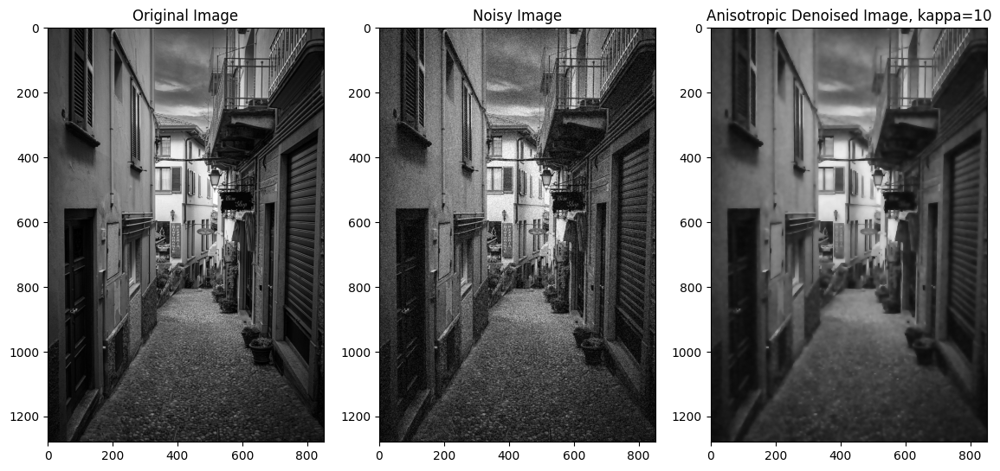

In [50]:
# Question 1

italy_image = io.imread("images/italy_street.jpg", as_gray=True)
italy_image = util.img_as_ubyte(italy_image)

# TODO: Add White Gaussian Noise to italy_image
italy_image_noisy = util.random_noise(italy_image, mode='gaussian', mean= 0 , var= 0.01)
italy_image_noisy = util.img_as_ubyte(italy_image_noisy)

# TODO: Apply anisotropic diffusion to italy_image_noisy
italy_image_denoised_k10, diffusion_psnr_k10 = anisotropic_diffusion(italy_image_noisy,italy_image, 50, 0.2, 10, stop_condition='fixed')

# Show PSNR values
print(f'PSNR for noisy image: {diffusion_psnr_k10[0]:.2f}')
print(f'PSNR for anisotropic denoised image, kappa=10: {diffusion_psnr_k10[-1]:.2f}')

# Show results
plt.figure(figsize=(14, 8))
plt.subplot(1, 3, 1)
plt.imshow(italy_image, cmap='gray')
plt.title('Original Image')
plt.subplot(1, 3, 2)
plt.imshow(italy_image_noisy, cmap='gray')
plt.title('Noisy Image')
plt.subplot(1, 3, 3)
plt.imshow(italy_image_denoised_k10, cmap='gray')
plt.title('Anisotropic Denoised Image, kappa=10')
plt.show()


PSNR for noisy image: 20.55
PSNR for anisotropic denoised image, kappa=10: 20.13


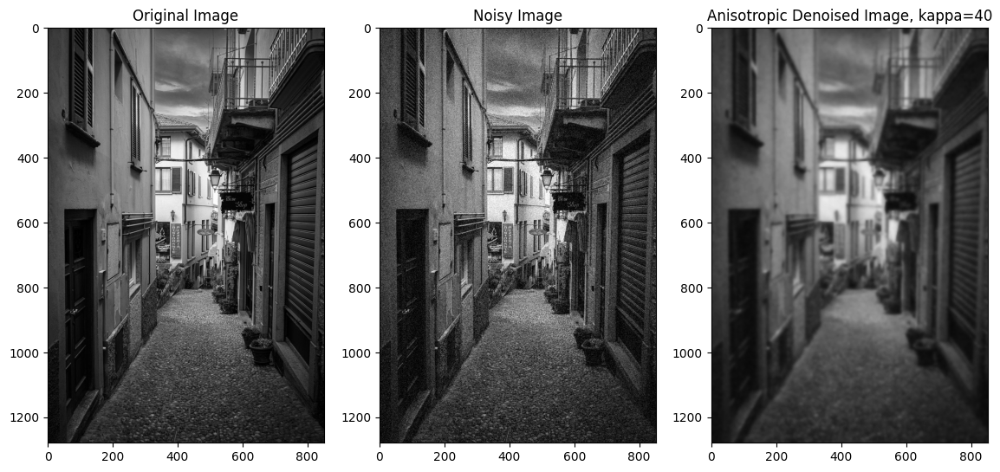

In [48]:
# Question 2

# TODO: Apply anisotropic diffusion to italy_image_noisy
italy_image_denoised_k40, diffusion_psnr_k10 = anisotropic_diffusion(italy_image_noisy,italy_image, 50, 0.2, 40, stop_condition='fixed')

# Show PSNR values
print(f'PSNR for noisy image: {diffusion_psnr_k10[0]:.2f}')
print(f'PSNR for anisotropic denoised image, kappa=10: {diffusion_psnr_k10[-1]:.2f}')

# Show results
plt.figure(figsize=(14, 8))
plt.subplot(1, 3, 1)
plt.imshow(italy_image, cmap='gray')
plt.title('Original Image')
plt.subplot(1, 3, 2)
plt.imshow(italy_image_noisy, cmap='gray')
plt.title('Noisy Image')
plt.subplot(1, 3, 3)
plt.imshow(italy_image_denoised_k10, cmap='gray')
plt.title('Anisotropic Denoised Image, kappa=40')
plt.show()

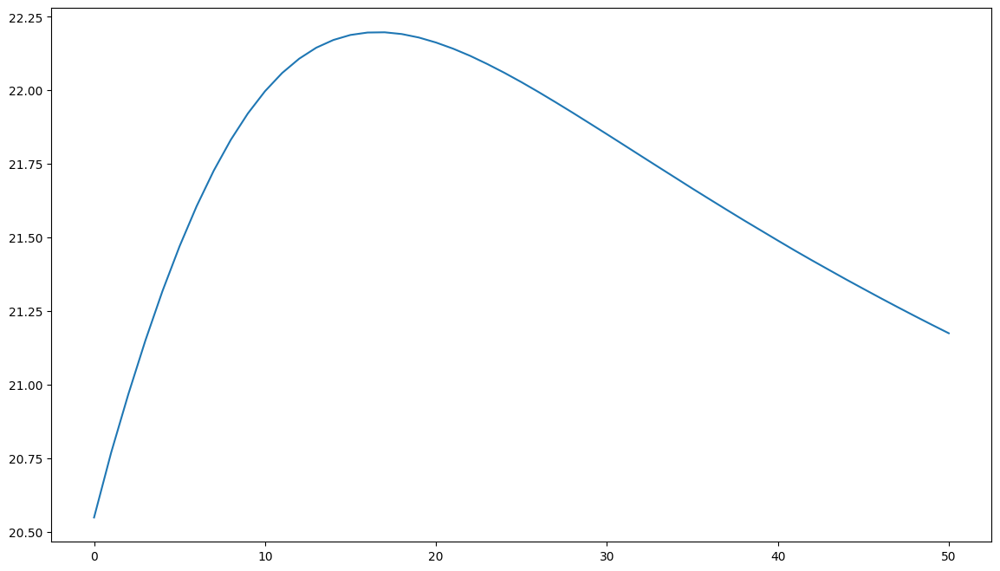

In [52]:
# Question 3

# TODO: Show PSNR as a function of the number of diffusion iterations (for kappa=10)
t = np.linspace(0,50,51)

# Show results
plt.figure(figsize=(14, 8))
plt.plot(t,diffusion_psnr_k10)

PSNR for noisy image: 20.55
PSNR for anisotropic denoised image, kappa=10 max PSNR: 22.20
Anisotropic denoised processing ran for 18 iterations


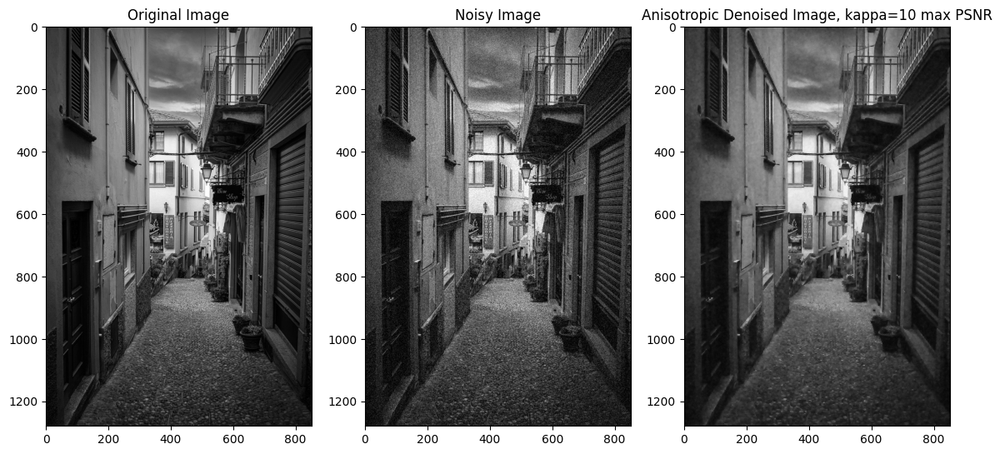

In [53]:
# Question 4

# TODO: Apply anisotropic diffusion to italy_image_noisy
italy_image_denoised_k10_maxPSNR, diffusion_psnr_k10_maxPSNR = anisotropic_diffusion(italy_image_noisy,italy_image, 50, 0.2, 10, stop_condition='PSNR')

# Show PSNR values and number of iterations
print(f'PSNR for noisy image: {diffusion_psnr_k10_maxPSNR[0]:.2f}')
print(f'PSNR for anisotropic denoised image, kappa=10 max PSNR: {diffusion_psnr_k10_maxPSNR[-1]:.2f}')
print(f'Anisotropic denoised processing ran for {len(diffusion_psnr_k10_maxPSNR)} iterations')

# Show results
plt.figure(figsize=(14, 8))
plt.subplot(1, 3, 1)
plt.imshow(italy_image, cmap='gray')
plt.title('Original Image')
plt.subplot(1, 3, 2)
plt.imshow(italy_image_noisy, cmap='gray')
plt.title('Noisy Image')
plt.subplot(1, 3, 3)
plt.imshow(italy_image_denoised_k10_maxPSNR, cmap='gray')
plt.title('Anisotropic Denoised Image, kappa=10 max PSNR')
plt.show()


PSNR for noisy image: 23.75
PSNR for anisotropic denoised image, kappa=10 max PSNR: 24.74
Anisotropic denoised processing ran for 9 iterations


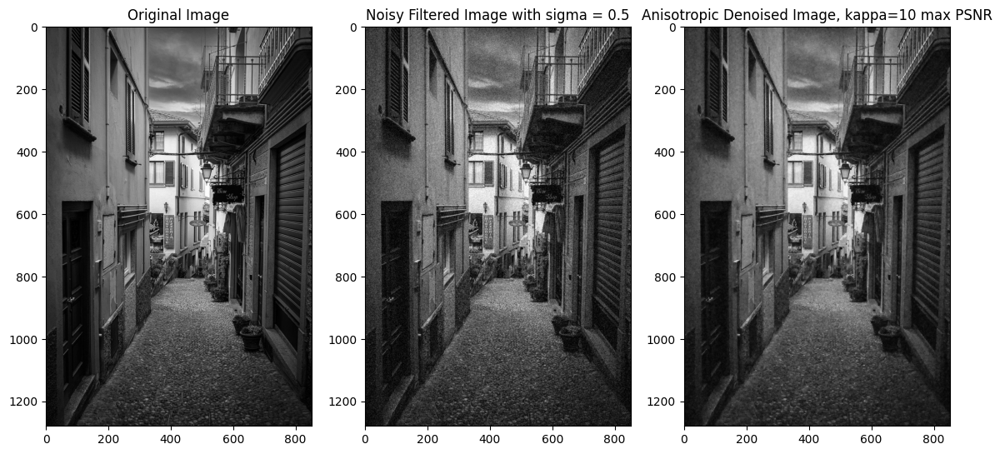

PSNR for noisy image: 24.82
PSNR for anisotropic denoised image, kappa=10 max PSNR: 25.04
Anisotropic denoised processing ran for 5 iterations


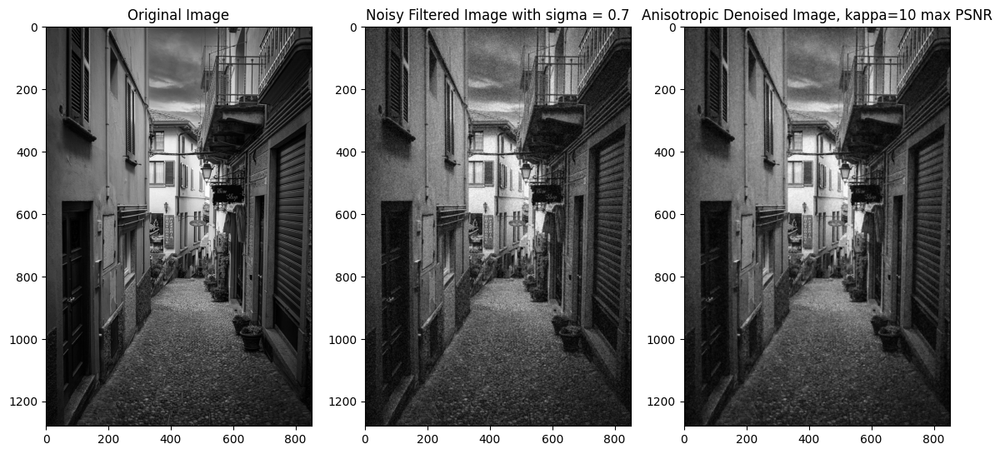

PSNR for noisy image: 24.03
PSNR for anisotropic denoised image, kappa=10 max PSNR: 24.03
Anisotropic denoised processing ran for 2 iterations


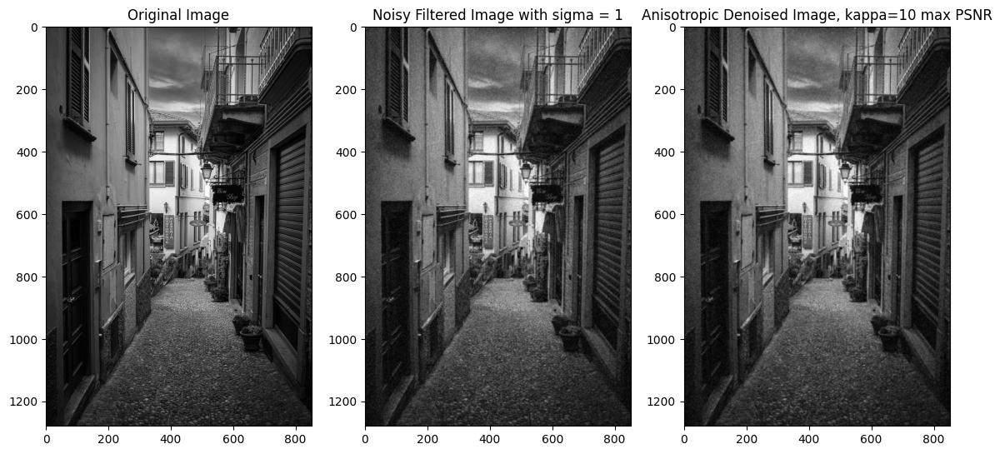

In [57]:
# Question 5

# TODO: Filter italy_image_noisy with a Gaussian filters with
#       standard deviation of 0.5, 0.7, 1 using 'filters.gaussian'
#       Don't forget to convert back to uint8 using 'util.img_as_ubyte'
sigma = [0.5,0.7,1]
italy_image_filtered = []

for i in range(3):
    italy_image_filteredV = filters.gaussian(italy_image_noisy,sigma[i])
    italy_image_filteredV = util.img_as_ubyte(italy_image_filteredV)
    italy_image_filtered_denoised, diffusion_filtered_psnr = anisotropic_diffusion(italy_image_filteredV,italy_image,50,0.2,10,stop_condition = 'PSNR')
    
    # Show PSNR values and number of iterations
    print(f'PSNR for noisy image: {diffusion_filtered_psnr[0]:.2f}')
    print(f'PSNR for anisotropic denoised image, kappa=10 max PSNR: {diffusion_filtered_psnr[-1]:.2f}')
    print(f'Anisotropic denoised processing ran for {len(diffusion_filtered_psnr)} iterations')

    # Show results
    plt.figure(figsize=(14, 8))
    plt.subplot(1, 3, 1)
    plt.imshow(italy_image, cmap='gray')
    plt.title('Original Image')
    plt.subplot(1, 3, 2)
    plt.imshow(italy_image_filteredV, cmap='gray')
    plt.title(f'Noisy Filtered Image with sigma = {sigma[i]}')
    plt.subplot(1, 3, 3)
    plt.imshow(italy_image_filtered_denoised, cmap='gray')
    plt.title('Anisotropic Denoised Image, kappa=10 max PSNR')
    plt.show()


# Assignment 4 - Denoising Using Total-Variation


In [58]:
def total_variation(image, iterations_num, delta_t=0.5, epsilon=1.0, use_fidelity_term=False):
    """
    Performs total variation denoising on a noisy image.

    Args:
        image (np.ndarray): The noisy image to be denoised.
        iterations_num (int): The number of iterations to perform for denoising.
        delta_t (float, default: 0.5): The size of the time step for each iteration.
        epsilon (float, default: 1.0): A small constant for regularization.
        use_fidelity_term (bool, default: False): Flag indicating whether to use the fidelity term.

    Returns:
        np.ndarray representing the denoised image.
    """

    height, width = image.shape
    epsilon2 = epsilon ** 2

    image = image.astype(np.float64)
    I0 = image
    lmbda = 0

    for _ in range(iterations_num):

        # Calculate first order image derivatives
        I_x = (image[:, list(range(1,width))+[width-1]] - image[:,[0] + list(range(width-1))]) / 2
        I_y = (image[list(range(1,height))+[height-1], :] - image[[0] + list(range(height-1)), :]) / 2

        # Calculate second order image derivatives
        I_xx = image[:, list(range(1,width))+[width-1]] + image[:,[0] + list(range(width-1))] - 2 * image
        I_yy = image[list(range(1,height))+[height-1], :] + image[[0] + list(range(height-1)), :] - 2 * image

        # Calculate diagonal image derivatives
        Dp = image[list(range(1,height))+[height-1], np.array(list(range(1,width))+[width-1]).reshape(width,1)].T + image[[0] + list(range(height-1)), np.array([0] + list(range(width-1))).reshape(width,1)].T
        Dm = image[[0] + list(range(height-1)), np.array(list(range(1,width))+[width-1]).reshape(width,1)].T + image[list(range(1,height))+[height-1], np.array([0] + list(range(width-1))).reshape(width,1)].T
        I_xy = (Dp - Dm) / 4

        # Calculate flow
        num = I_xx * (epsilon2 + I_y**2) - 2 * I_x * I_y * I_xy + I_yy * (epsilon2 + I_x**2)
        den = (epsilon2 + I_x**2 + I_y**2) ** (3 / 2)
        div = num / den

        # Update image using the evolution equation
        I_t = div + lmbda * (I0 - image)
        # TODO: Update image for next iteration
        image = image + delta_t * I_t

    # If fidelity term is enabled, update lambda
    if use_fidelity_term:
        lmbda = np.mean(div * (image - I0)) / np.var(image)

    return np.clip(image, 0, 255)


In [75]:
# Question 2

# TODO: Load two images
sand_img = io.imread("images/book_in_sand.jpg", as_gray=True)
sand_img = util.img_as_ubyte(sand_img)

mail_img = io.imread("images/mailbox.jpg", as_gray=True)
mail_img = util.img_as_ubyte(mail_img)

# TODO: Add white Gaussian noise with variance 0.05 to the two images using the 'util.random_noise' function
noisy_sandg = util.random_noise(sand_img, mode='gaussian', mean=0, var=0.05)
noisy_sandg = 255*noisy_sandg
noisy_sandg = noisy_sandg.astype(np.uint8)

noisy_mailg = util.random_noise(mail_img, mode='gaussian', mean=0, var=0.05)
noisy_mailg = 255*noisy_mailg
noisy_mailg = noisy_mailg.astype(np.uint8)

# TODO: Add Salt & Pepper noise with density 0.2 to the two images using the 'util.random_noise' function

noisy_sands = util.random_noise(sand_img, mode='s&p',amount=0.2)
noisy_sands = 255*noisy_sands
noisy_sands = noisy_sands.astype(np.uint8)

noisy_mails = util.random_noise(mail_img, mode='s&p', amount=0.2)
noisy_mails = 255*noisy_mails
noisy_mails = noisy_mails.astype(np.uint8)

# TODO: Apply anisotropic diffusion denoising to the four noisy images
sand_deniosedg, diffusion_filtered_psnrsg = anisotropic_diffusion(noisy_sandg,sand_img, 50, 0.2, 10, stop_condition = 'PSNR')
sand_denioseds, diffusion_filtered_psnrss = anisotropic_diffusion(noisy_sands,sand_img,50,0.2,10,stop_condition = 'PSNR')

mail_deniosedg, diffusion_filtered_psnrmg = anisotropic_diffusion(noisy_mailg,mail_img,50,0.2,10,stop_condition = 'PSNR')
mail_denioseds, diffusion_filtered_psnrms = anisotropic_diffusion(noisy_mails,mail_img,50,0.2,10,stop_condition = 'PSNR')
 
# TODO: Apply total variation denoising to the four noisy images
sandgfinal=total_variation(sand_deniosedg, 200, delta_t=0.5, epsilon=1.0, use_fidelity_term=False)
sandsfinal=total_variation(sand_denioseds, 200, delta_t=0.5, epsilon=1.0, use_fidelity_term=False)
mailgfinal=total_variation(mail_deniosedg, 200, delta_t=0.5, epsilon=1.0, use_fidelity_term=False)
mailsfinal=total_variation(mail_denioseds, 200, delta_t=0.5, epsilon=1.0, use_fidelity_term=False)



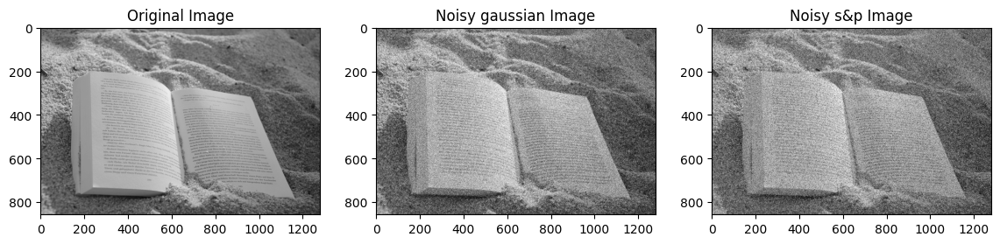

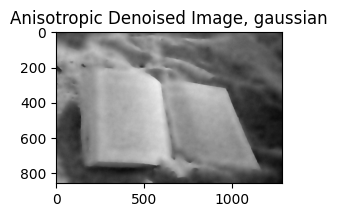

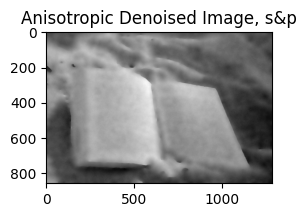

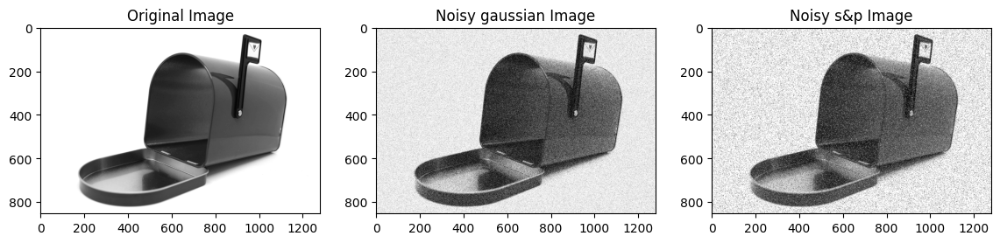

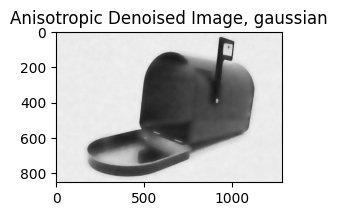

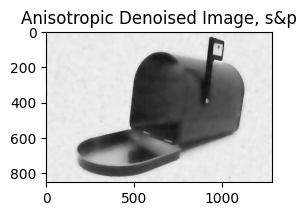

In [83]:
# TODO: Show the results
plt.figure(figsize=(14, 8))
plt.subplot(2, 3, 1)
plt.imshow(sand_img, cmap='gray')
plt.title('Original Image')
plt.subplot(2, 3, 2)
plt.imshow(noisy_sandg, cmap='gray')
plt.title('Noisy gaussian Image')
plt.subplot(2, 3, 3)
plt.imshow(noisy_sands, cmap='gray')
plt.title('Noisy s&p Image')
plt.show()
plt.subplot(2, 2, 1)
plt.imshow(sandgfinal, cmap='gray')
plt.title('Anisotropic Denoised Image, gaussian')
plt.show()
plt.subplot(2, 2, 2)
plt.imshow(sandsfinal, cmap='gray')
plt.title('Anisotropic Denoised Image, s&p')
plt.show()
    
plt.figure(figsize=(14, 8))
plt.subplot(2, 3, 1)
plt.imshow(mail_img, cmap='gray')
plt.title('Original Image')
plt.subplot(2, 3, 2)
plt.imshow(noisy_mailg, cmap='gray')
plt.title('Noisy gaussian Image')
plt.subplot(2, 3, 3)
plt.imshow(noisy_mails, cmap='gray')
plt.title('Noisy s&p Image')
plt.show()
plt.subplot(2, 2, 1)
plt.imshow(mailgfinal, cmap='gray')
plt.title('Anisotropic Denoised Image, gaussian')
plt.show()
plt.subplot(2, 2, 2)
plt.imshow(mailsfinal, cmap='gray')
plt.title('Anisotropic Denoised Image, s&p')
plt.show()

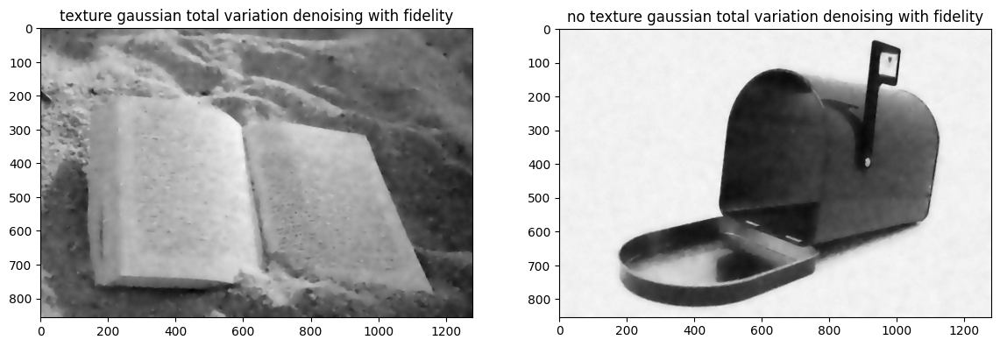

In [84]:
# Question 3

# TODO: Apply total variation denoising with fidelity term enabled to the two images with White Gaussian Noise
texture_image_gaus = total_variation(image=noisy_sandg, iterations_num=200, delta_t=0.5, epsilon=1.0, use_fidelity_term=True)
no_texture_image_gaus = total_variation(image=noisy_mailg, iterations_num=200, delta_t=0.5, epsilon=1.0, use_fidelity_term=True)
# TODO: Show the results
plt.figure(figsize=(14, 7))
plt.subplot(1, 2, 1)
plt.imshow(texture_image_gaus, cmap='gray')
plt.title('texture gaussian total variation denoising with fidelity')
plt.subplot(1, 2, 2)
plt.imshow(no_texture_image_gaus, cmap='gray')
plt.title('no texture gaussian total variation denoising with fidelity')
plt.show()